In [ ]:
# Check if a GPU is available
import tensorflow as tf

# List available GPUs
physical_devices = tf.config.list_physical_devices('GPU')

if physical_devices:
    print(f"GPU is available: {physical_devices}")
    for device in physical_devices:
        print(f"Device: {device}")
else:
    print("GPU is not available, using CPU.")


GPU is available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Device: PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [ ]:
# Set memory growth to avoid using all memory at once
for device in physical_devices:
    tf.config.experimental.set_memory_growth(device, True)


In [ ]:
# Install TensorFlow (GPU version)
!pip install tensorflow-gpu


  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [ ]:
# Use nvidia-smi to check GPU usage
!nvidia-smi


Sat Feb  1 21:55:35 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   42C    P8              9W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
from google.colab import files
uploaded = files.upload()  # To upload your dataset zip file


Saving archive (6).zip to archive (6).zip


In [ ]:
import zipfile
with zipfile.ZipFile('/content/archive (6).zip', 'r') as zip_ref:
    zip_ref.extractall('/content/dfu_dataset')


In [ ]:
import os

# List the contents of the /content/dfu_dataset folder
print(os.listdir('/content/dfu_dataset'))


['DFU']


In [ ]:
import zipfile

# Check the contents of the ZIP file
zip_path = '/content/archive (6).zip'  # Adjust this if necessary
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.testzip()  # This will check if the ZIP file is intact and list the files
    print(zip_ref.namelist())  # List the contents inside the ZIP file


['DFU/Original Images/1.jpg', 'DFU/Original Images/1.png', 'DFU/Original Images/10.jpg', 'DFU/Original Images/1054877509612379438.jpg', 'DFU/Original Images/1076771990506636278.jpg', 'DFU/Original Images/11.jpg', 'DFU/Original Images/12.jpg', 'DFU/Original Images/13.jpg', 'DFU/Original Images/14.jpg', 'DFU/Original Images/1430965400006561945.jpg', 'DFU/Original Images/15.jpg', 'DFU/Original Images/16.jpg', 'DFU/Original Images/17.JPG', 'DFU/Original Images/18.jpg', 'DFU/Original Images/19.jpg', 'DFU/Original Images/2 (2).jpg', 'DFU/Original Images/2.jpg', 'DFU/Original Images/2.png', 'DFU/Original Images/20.jpg', 'DFU/Original Images/21.jpg', 'DFU/Original Images/2100472819858240689.jpg', 'DFU/Original Images/2120045598224772295.jpg', 'DFU/Original Images/2166365910321328840.jpg', 'DFU/Original Images/22.JPG', 'DFU/Original Images/2248535364383155415.jpg', 'DFU/Original Images/23.jpg', 'DFU/Original Images/2331076783926122268.jpg', 'DFU/Original Images/24.jpg', 'DFU/Original Images/25.

In [ ]:
import shutil

# Remove the existing dataset folder if it was extracted incorrectly
shutil.rmtree('/content/dfu_dataset')

# Re-extract the dataset
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall('/content/dfu_dataset')

# Verify contents again
print(os.listdir('/content/dfu_dataset'))


['DFU']


In [ ]:
# List the contents of the extracted directory again to find any relevant folders
print(os.listdir('/content/dfu_dataset'))


['DFU']


In [ ]:
TRAIN_PATH = os.path.join('/content/dfu_dataset', 'original_images')  # Adjust based on the actual folder name


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
import keras
from keras.layers import Dense,GlobalAveragePooling2D , Dropout, Flatten, BatchNormalization
from keras.applications import MobileNet
from tensorflow.keras.applications import EfficientNetB0, ResNet50
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras import optimizers
from tensorflow.keras import losses
from tensorflow.keras import callbacks
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.preprocessing import image
from keras.applications.mobilenet import preprocess_input
from keras.models import Model
from keras.optimizers import Adam

In [ ]:
# Define Constants
TRAIN_PATH = '/content/dfu_dataset/DFU/Patches'
TEST_PATH = '/content/dfu_dataset/DFU/TestSet'

BATCH_SIZE = 20
IMAGE_HEIGHT = 224
IMAGE_WIDTH = 224
NUM_CLASSES = 2
EPOCHS = 100

In [ ]:
# Load the Training and Validation Dataset
train_ds = image_dataset_from_directory(
    TRAIN_PATH,
    labels = 'inferred',
    validation_split = 0.2,
    batch_size = BATCH_SIZE,
    image_size = (IMAGE_WIDTH, IMAGE_HEIGHT),
    subset = 'training',
    seed = 0
)

validation_ds = image_dataset_from_directory(
    TRAIN_PATH,
    labels = 'inferred',
    validation_split = 0.2,
    batch_size = BATCH_SIZE,
    image_size = (IMAGE_WIDTH, IMAGE_HEIGHT),
    subset = 'validation',
    seed = 0
)

Found 1055 files belonging to 2 classes.
Using 844 files for training.
Found 1055 files belonging to 2 classes.
Using 211 files for validation.


In [ ]:
# Load Test Dataset
def decode_img(img):
  # Convert the compressed string to a 3D uint8 tensor
  img = tf.io.decode_jpeg(img, channels=3)
  # Resize the image to the desired size
  return tf.image.resize(img, [IMAGE_HEIGHT, IMAGE_WIDTH])

def process_path(file_path):
  # Load the raw data from the file as a string
  img = tf.io.read_file(file_path)
  img = decode_img(img)
  return img

test_ds = tf.data.Dataset.list_files(str(TEST_PATH + '/*'), shuffle=False)
# test_ds = test_ds.shuffle(len(os.listdir(TEST_PATH)), reshuffle_each_iteration=False)
test_ds = test_ds.map(process_path, num_parallel_calls=tf.data.AUTOTUNE)

In [ ]:
# Get the class names
class_names = train_ds.class_names
print(class_names)

['Abnormal(Ulcer)', 'Normal(Healthy skin)']


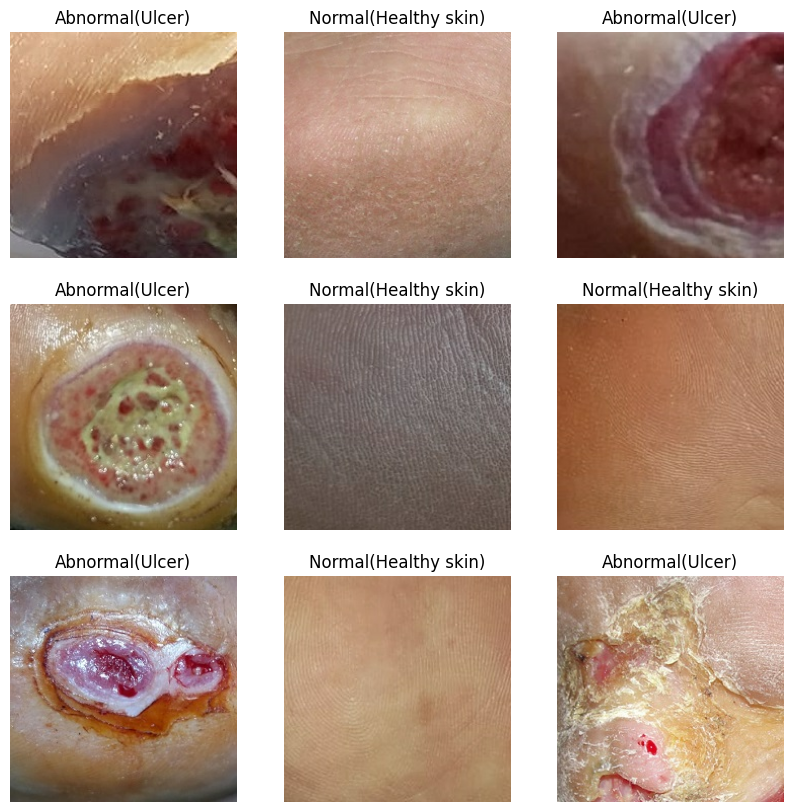

In [ ]:
# Visualize the training dataset
plt.figure(figsize = (10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

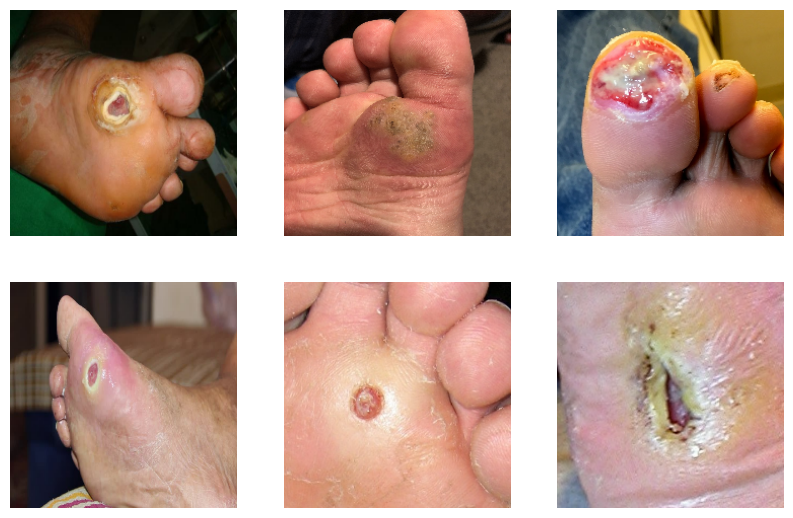

In [ ]:
# Visualize the testing dataset
plt.figure(figsize = (10, 10))

i = 0
for images in test_ds.take(6):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images.numpy().astype("uint8"))
    plt.axis("off")
    i += 1

In [ ]:
# Layers of Augmentation
img_augmentation = Sequential(
    [
        layers.RandomRotation(factor = 0.15),
        layers.RandomTranslation(height_factor = 0.1, width_factor = 0.1),
        layers.RandomFlip(),
        layers.GaussianNoise(stddev = 0.09),
        layers.RandomContrast(factor = 0.1),
    ],
    name = "img_augmentation"
)

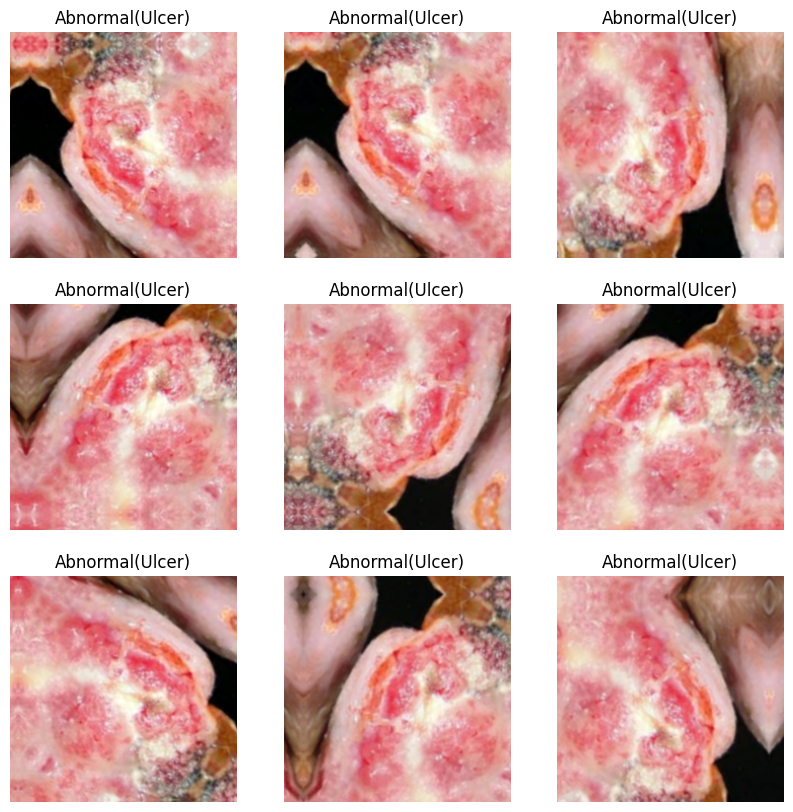

In [ ]:
# View the augmentations
plt.figure(figsize = (10, 10))
for image, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        aug_img = img_augmentation(tf.expand_dims(image[0], axis = 0))
        plt.imshow(aug_img[0].numpy().astype("uint8"))
        plt.title(class_names[labels[0]])
        plt.axis("off")

In [ ]:
# Caching and Prefetching (Optimization)
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size = AUTOTUNE)
validation_ds = validation_ds.cache().prefetch(buffer_size = AUTOTUNE)

In [ ]:
# Define Callbacks
lr_callback = callbacks.ReduceLROnPlateau(monitor = 'val_accuracy', factor = 0.1, patience = 5)
stop_callback = callbacks.EarlyStopping(monitor = 'val_accuracy', patience = 8)

## EfficientNetB0

In [ ]:
def build_model():
    inputs = layers.Input(shape=(IMAGE_WIDTH, IMAGE_HEIGHT, 3))

    # Do NOT apply img_augmentation inside the model definition
    base_model = EfficientNetB0(include_top=False, weights='imagenet', input_tensor=inputs)

    # Rebuild the top layers
    x = layers.GlobalAveragePooling2D(name="avg_pool")(base_model.output)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.4, name="top_dropout")(x)
    outputs = layers.Dense(NUM_CLASSES, activation="sigmoid", name="pred")(x)

    # Compile the model
    model = tf.keras.Model(inputs, outputs, name="EfficientNet")
    optimizer = optimizers.Adam(learning_rate=1e-3)
    loss = losses.SparseCategoricalCrossentropy()

    model.compile(optimizer=optimizer, loss=loss, metrics=["accuracy"])

    model.summary()

    return model


In [ ]:
# Apply augmentation in the dataset pipeline instead of inside the model
def augment(image, label):
    return img_augmentation(image), label  # Apply augmentation only on images

train_ds = train_ds.map(augment, num_parallel_calls=tf.data.AUTOTUNE)


In [ ]:
# Build and train the model
model = build_model()

history = model.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=validation_ds,
    callbacks=[lr_callback, stop_callback]
)


Model: "EfficientNet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 224, 224, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 224, 224, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 4,057,253 (15.48 MB)

 Trainable params: 4,012,670 (15.31 MB)

 Non-trainable params: 44,583 (174.16 KB)

Epoch 1/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 135s 1s/step - accuracy: 0.8545 - loss: 0.3892 - val_accuracy: 0.9147 - val_loss: 0.2302 - learning_rate: 0.0010
Epoch 2/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 11s 237ms/step - accuracy: 0.9711 - loss: 0.1026 - val_accuracy: 0.9716 - val_loss: 0.0687 - learning_rate: 0.0010
Epoch 3/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 10s 230ms/step - accuracy: 0.9705 - loss: 0.1017 - val_accuracy: 0.8863 - val_loss: 0.3550 - learning_rate: 0.0010
Epoch 4/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 9s 209ms/step - accuracy: 0.9738 - loss: 0.0718 - val_accuracy: 0.9810 - val_loss: 0.0962 - learning_rate: 0.0010
Epoch 5/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 10s 200ms/step - accuracy: 0.9865 - loss: 0.0356 - val_accuracy: 0.9336 - val_loss: 0.1845 - learning_rate: 0.0010
Epoch 6/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 11s 239ms/step - accuracy: 0.9932 - loss: 0.0236 - val_accuracy: 0.9763 - val_loss: 0.0568 - learning_rate: 0.0010
Epoch 7/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 20s 237ms/step - accuracy: 0.9796 - loss

In [ ]:
# Print final training and validation accuracy
final_train_acc = history.history['accuracy'][-1]
final_val_acc = history.history['val_accuracy'][-1]

print(f"Final Training Accuracy: {final_train_acc * 100:.2f}%")
print(f"Final Validation Accuracy: {final_val_acc * 100:.2f}%")


Final Training Accuracy: 99.76%
Final Validation Accuracy: 99.05%


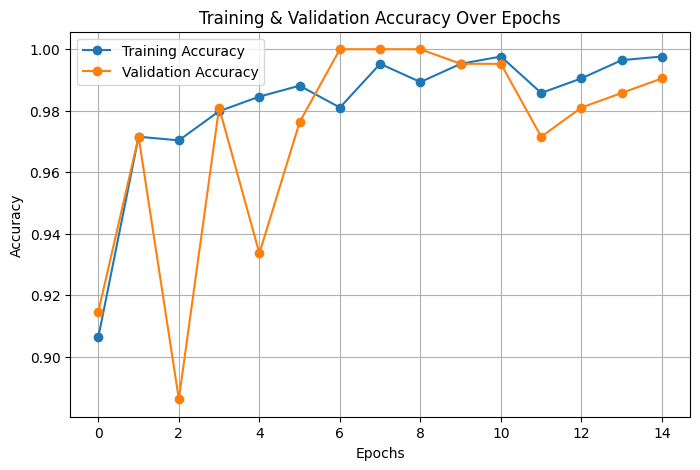

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy
plt.figure(figsize=(8, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training & Validation Accuracy Over Epochs")
plt.legend()
plt.grid()
plt.show()


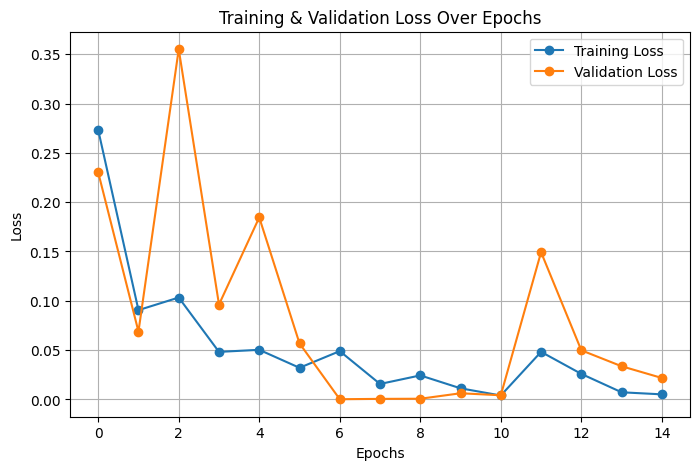

In [ ]:
# Plot training & validation loss
plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label='Training Loss', marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training & Validation Loss Over Epochs")
plt.legend()
plt.grid()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


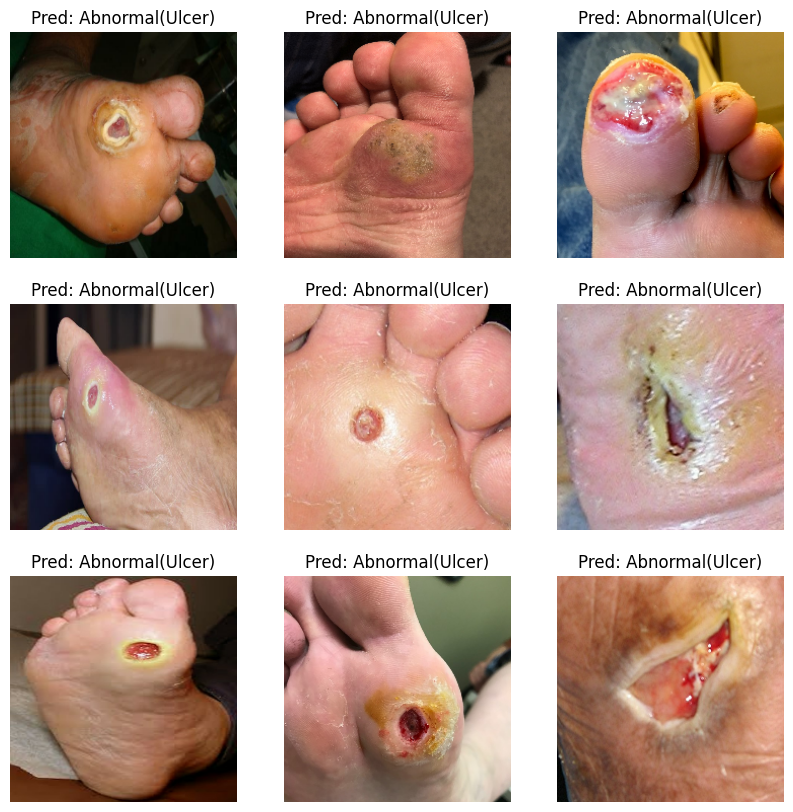

In [ ]:
# Visualize predictions on test dataset
plt.figure(figsize=(10, 10))

i = 0
for image in test_ds.take(9):  # Take first 9 images
    pred = model.predict(tf.expand_dims(image, axis=0))  # Predict single image
    predicted_label = class_names[np.argmax(pred)]

    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image.numpy().astype("uint8"))
    plt.title(f"Pred: {predicted_label}")
    plt.axis("off")
    i += 1

plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


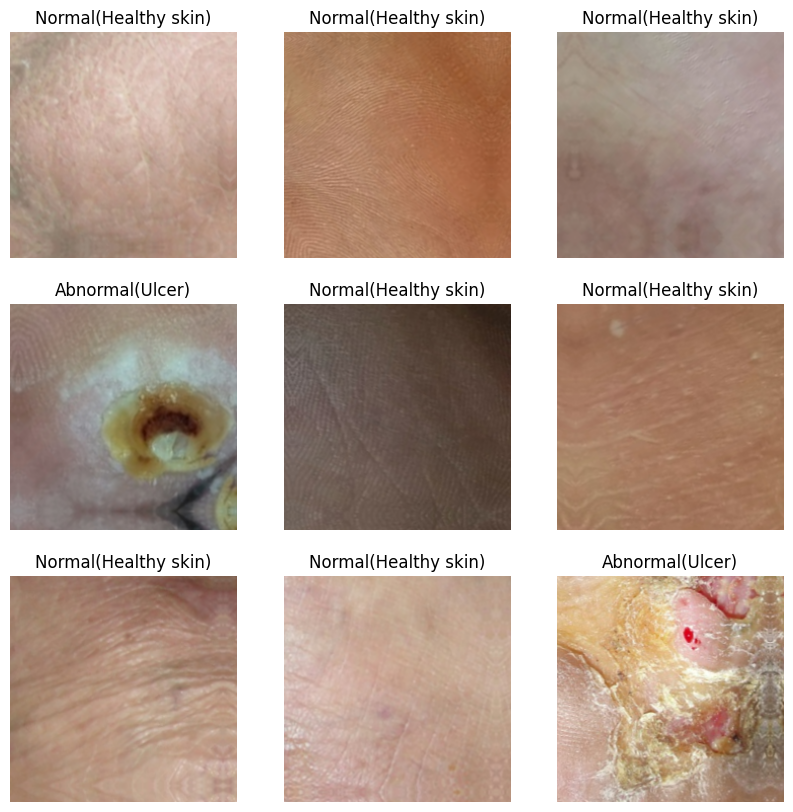

In [ ]:
# Testing on Training Set
plt.figure(figsize = (10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        prediction = np.argmax(model.predict(np.array([images[i]])), axis = 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[prediction[0]])
        plt.axis("off")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


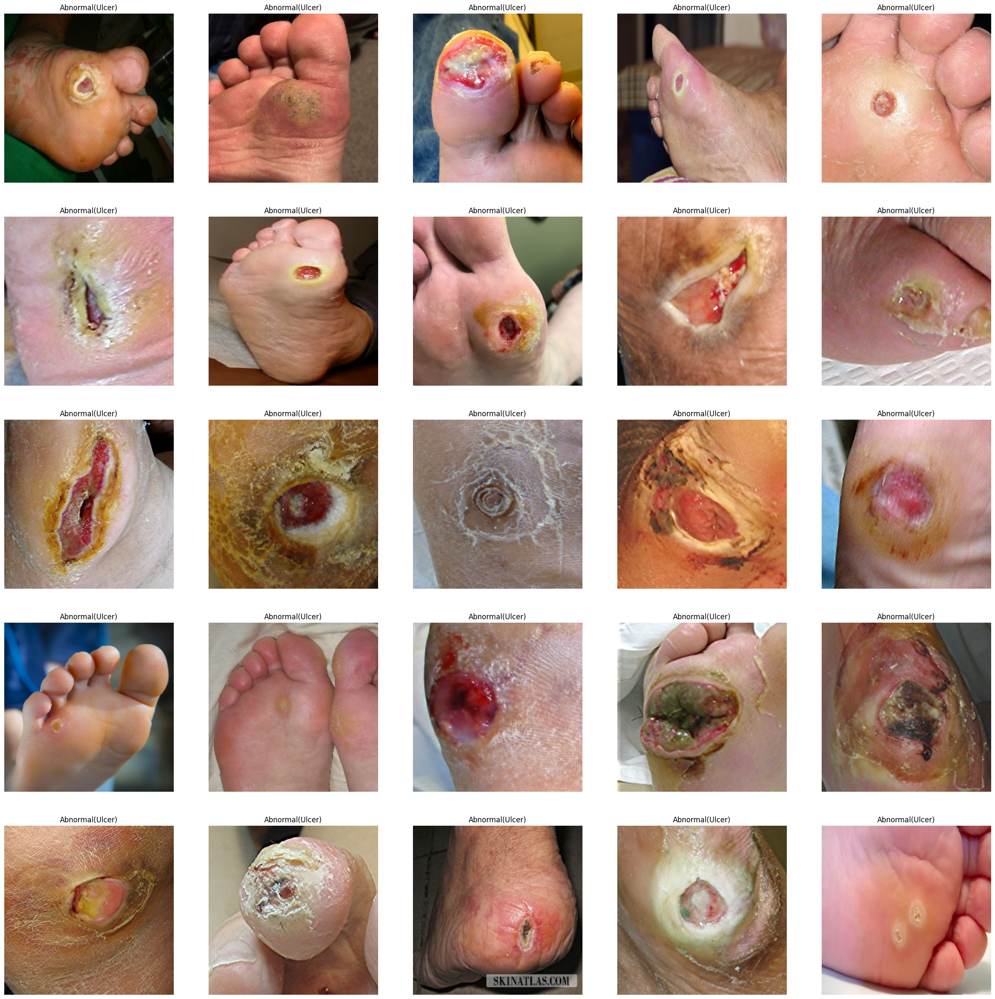

In [ ]:
# Testing on Test Set
plt.figure(figsize = (30, 30))
plt.tight_layout()

i = 0
for images in test_ds.take(25):
    ax = plt.subplot(5, 5, i + 1)
    prediction = np.argmax(model.predict(np.array([images])), axis = 1)
    plt.imshow(images.numpy().astype("uint8"))
    plt.title(class_names[prediction[0]])
    plt.axis("off")

    i += 1

## MobileNet Model

In [ ]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras import layers, optimizers, losses
import tensorflow as tf


# Initialize Model
def build_model():
    # Input layer
    inputs = layers.Input(shape=(IMAGE_WIDTH, IMAGE_HEIGHT, 3))

    # Data augmentation block (optional, replace with your own augmentation pipeline)
    x = img_augmentation(inputs)

    # Load MobileNet with pre-trained ImageNet weights
    base_model = MobileNet(include_top=False, weights="imagenet", input_tensor=x)

    # Rebuild the top layers
    x = layers.GlobalAveragePooling2D(name="avg_pool")(base_model.output)
    x = layers.BatchNormalization()(x)

    top_dropout_rate = 0.4
    x = layers.Dropout(top_dropout_rate, name="top_dropout")(x)

    # Add the output layer
    outputs = layers.Dense(NUM_CLASSES, activation="softmax", name="pred")(x)

    # Create the complete model
    model = tf.keras.Model(inputs, outputs, name="MobileNet")

    # Compile the model
    optimizer = optimizers.Adam(learning_rate=1e-3)
    loss = losses.SparseCategoricalCrossentropy()  # Use `CategoricalCrossentropy` for one-hot labels
    model.compile(
        optimizer=optimizer, loss=loss, metrics=["accuracy"]
    )

    model.summary()

    return model

In [ ]:
# Build the model
model = build_model()


history = model.fit(train_ds, validation_data = validation_ds,
                    callbacks = [lr_callback, stop_callback],
                    epochs = EPOCHS, verbose = 1)

<ipython-input-50-4d87037db712>:15: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNet(include_top=False, weights="imagenet", input_tensor=x)


17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "MobileNet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ img_augmentation (Sequential)        │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 112, 112, 32)        │             864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_bn (BatchNormalization)        │ (None, 112, 112, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_relu (ReLU)                    │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1 (DepthwiseConv2D)          │ (None, 112, 112, 32)        │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_bn (BatchNormalization)    │ (None, 112, 112, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_relu (ReLU)                │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1 (Conv2D)                   │ (None, 112, 112, 64)        │           2,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_bn (BatchNormalization)    │ (None, 112, 112, 64)        │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_relu (ReLU)                │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pad_2 (ZeroPadding2D)           │ (None, 113, 113, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2 (DepthwiseConv2D)          │ (None, 56, 56, 64)          │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_bn (BatchNormalization)    │ (None, 56, 56, 64)          │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_relu (ReLU)                │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2 (Conv2D)                   │ (None, 56, 56, 128)         │           8,192 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_bn (BatchNormalization)    │ (None, 56, 56, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_relu (ReLU)                │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3 (DepthwiseConv2D)          │ (None, 56, 56, 128)         │           1,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_bn (BatchNormalization)    │ (None, 56, 56, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_relu (ReLU)                │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 3,235,010 (12.34 MB)

 Trainable params: 3,211,074 (12.25 MB)

 Non-trainable params: 23,936 (93.50 KB)

Epoch 1/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 32s 281ms/step - accuracy: 0.8763 - loss: 0.4582 - val_accuracy: 0.8815 - val_loss: 0.9225 - learning_rate: 0.0010
Epoch 2/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 15s 216ms/step - accuracy: 0.9406 - loss: 0.2719 - val_accuracy: 0.8483 - val_loss: 1.4667 - learning_rate: 0.0010
Epoch 3/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 11s 234ms/step - accuracy: 0.9591 - loss: 0.1706 - val_accuracy: 0.9810 - val_loss: 0.0696 - learning_rate: 0.0010
Epoch 4/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 22s 285ms/step - accuracy: 0.9780 - loss: 0.1566 - val_accuracy: 0.9668 - val_loss: 0.2652 - learning_rate: 0.0010
Epoch 5/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 20s 268ms/step - accuracy: 0.9744 - loss: 0.1119 - val_accuracy: 0.9905 - val_loss: 0.0588 - learning_rate: 0.0010
Epoch 6/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 10s 220ms/step - accuracy: 0.9793 - loss: 0.0592 - val_accuracy: 0.9810 - val_loss: 0.0964 - learning_rate: 0.0010
Epoch 7/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - accuracy: 0.9760 - l

In [ ]:

# Get final training and validation accuracy
train_acc = history.history['accuracy'][-1]
val_acc = history.history['val_accuracy'][-1]

print(f"Final Training Accuracy: {train_acc:.4f}")
print(f"Final Validation Accuracy: {val_acc:.4f}")


Final Training Accuracy: 0.9953
Final Validation Accuracy: 0.9905


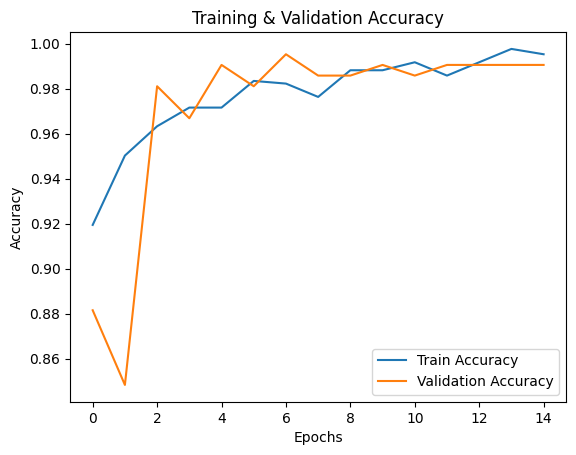

In [ ]:
import matplotlib.pyplot as plt

# Plot accuracy
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training & Validation Accuracy")
plt.legend()
plt.show()


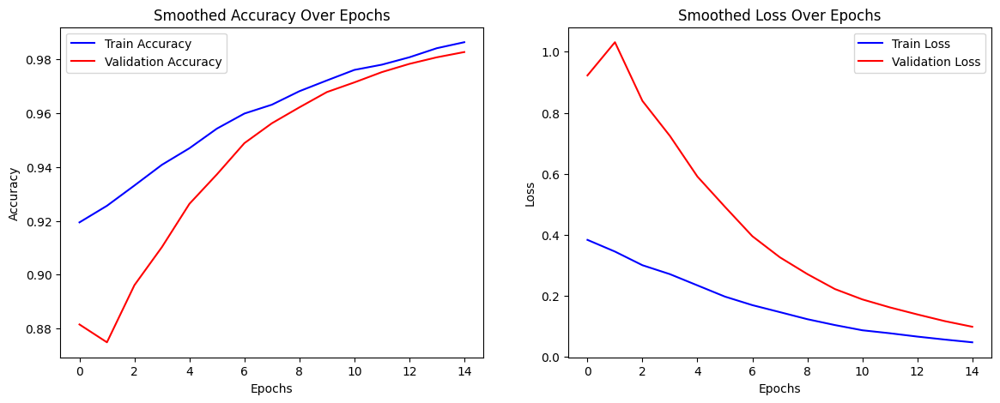

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Function to smooth curves for better visualization
def smooth_curve(points, factor=0.8):
    smoothed_points = []
    for point in points:
        if smoothed_points:
            smoothed_points.append(smoothed_points[-1] * factor + point * (1 - factor))
        else:
            smoothed_points.append(point)
    return smoothed_points

# Plot accuracy and loss
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# Smoothed Accuracy Plot
ax[0].plot(smooth_curve(history.history['accuracy']), label='Train Accuracy', color='blue')
ax[0].plot(smooth_curve(history.history['val_accuracy']), label='Validation Accuracy', color='red')
ax[0].set_title("Smoothed Accuracy Over Epochs")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")
ax[0].legend()

# Smoothed Loss Plot
ax[1].plot(smooth_curve(history.history['loss']), label='Train Loss', color='blue')
ax[1].plot(smooth_curve(history.history['val_loss']), label='Validation Loss', color='red')
ax[1].set_title("Smoothed Loss Over Epochs")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")
ax[1].legend()

plt.show()


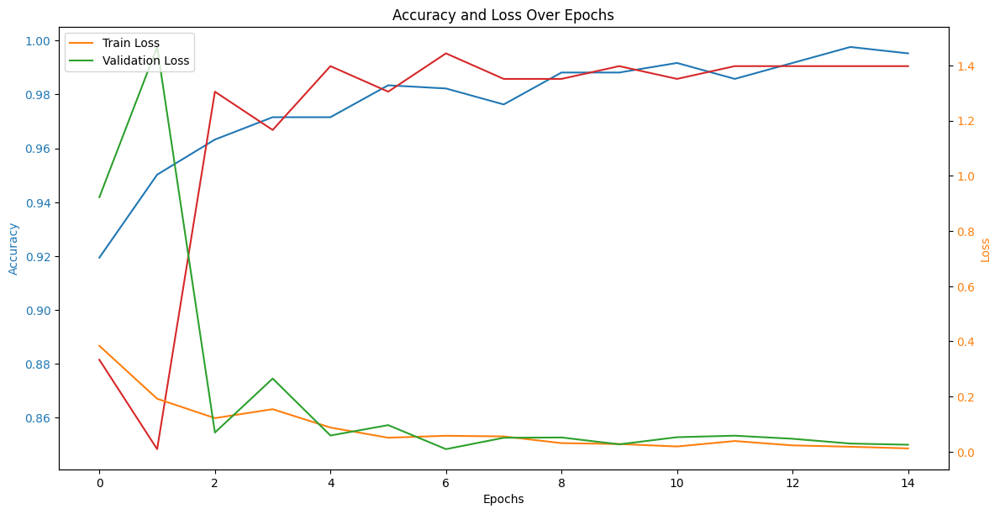

In [ ]:
# Plot combined accuracy and loss
fig, ax1 = plt.subplots(figsize=(12, 6))

color = 'tab:blue'
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy', color=color)
ax1.plot(history.history['accuracy'], label='Train Accuracy', color=color)
ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', color='tab:red')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:orange'
ax2.set_ylabel('Loss', color=color)
ax2.plot(history.history['loss'], label='Train Loss', color=color)
ax2.plot(history.history['val_loss'], label='Validation Loss', color='tab:green')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # Adjust layout to avoid overlap
plt.title("Accuracy and Loss Over Epochs")
plt.legend(loc='upper left')
plt.show()


# DenseNet121 Model

In [ ]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras import layers, optimizers, losses
import tensorflow as tf


# Initialize Model
def build_model():
    # Input layer
    inputs = layers.Input(shape=(IMAGE_WIDTH, IMAGE_HEIGHT, 3))

    # Data augmentation block (optional, replace with your own augmentation pipeline)
    x = img_augmentation(inputs)

    # Load DenseNet121 with pre-trained ImageNet weights
    base_model = DenseNet121(include_top=False, weights="imagenet", input_tensor=x)

    # Rebuild the top layers
    x = layers.GlobalAveragePooling2D(name="avg_pool")(base_model.output)
    x = layers.BatchNormalization()(x)

    top_dropout_rate = 0.4
    x = layers.Dropout(top_dropout_rate, name="top_dropout")(x)

    # Add the output layer
    outputs = layers.Dense(NUM_CLASSES, activation="softmax", name="pred")(x)

    # Create the complete model
    model = tf.keras.Model(inputs, outputs, name="DenseNet121")

    # Compile the model
    optimizer = optimizers.Adam(learning_rate=1e-3)
    loss = losses.SparseCategoricalCrossentropy()  # Use `CategoricalCrossentropy` for one-hot labels
    model.compile(
        optimizer=optimizer, loss=loss, metrics=["accuracy"]
    )

    model.summary()

    return model

In [ ]:
# Build the model
model = build_model()


history = model.fit(train_ds, validation_data = validation_ds,
                    callbacks = [lr_callback, stop_callback],
                    epochs = EPOCHS, verbose = 1)

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "DenseNet121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ img_augmentation          │ (None, 224, 224, 3)    │              0 │ input_layer_4[0][0]    │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ img_augmentation[2][0] │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 7,043,650 (26.87 MB)

 Trainable params: 6,957,954 (26.54 MB)

 Non-trainable params: 85,696 (334.75 KB)

Epoch 1/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 118s 700ms/step - accuracy: 0.8447 - loss: 0.4704 - val_accuracy: 0.5213 - val_loss: 293.0388 - learning_rate: 0.0010
Epoch 2/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 21s 476ms/step - accuracy: 0.9347 - loss: 0.1816 - val_accuracy: 0.4787 - val_loss: 134.5889 - learning_rate: 0.0010
Epoch 3/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 21s 491ms/step - accuracy: 0.9317 - loss: 0.1708 - val_accuracy: 0.4787 - val_loss: 141.3708 - learning_rate: 0.0010
Epoch 4/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 21s 477ms/step - accuracy: 0.9594 - loss: 0.1034 - val_accuracy: 0.9052 - val_loss: 0.4168 - learning_rate: 0.0010
Epoch 5/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 490ms/step - accuracy: 0.9552 - loss: 0.1263 - val_accuracy: 0.9384 - val_loss: 0.2698 - learning_rate: 0.0010
Epoch 6/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 21s 477ms/step - accuracy: 0.9780 - loss: 0.0738 - val_accuracy: 0.9668 - val_loss: 0.1174 - learning_rate: 0.0010
Epoch 7/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 22s 494ms/step - accuracy: 0.9

In [ ]:
# Print final accuracy and loss for training and validation
print(f"Final Training Accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Final Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}")
print(f"Final Training Loss: {history.history['loss'][-1]:.4f}")
print(f"Final Validation Loss: {history.history['val_loss'][-1]:.4f}")


Final Training Accuracy: 0.9953
Final Validation Accuracy: 0.9905
Final Training Loss: 0.0162
Final Validation Loss: 0.0327


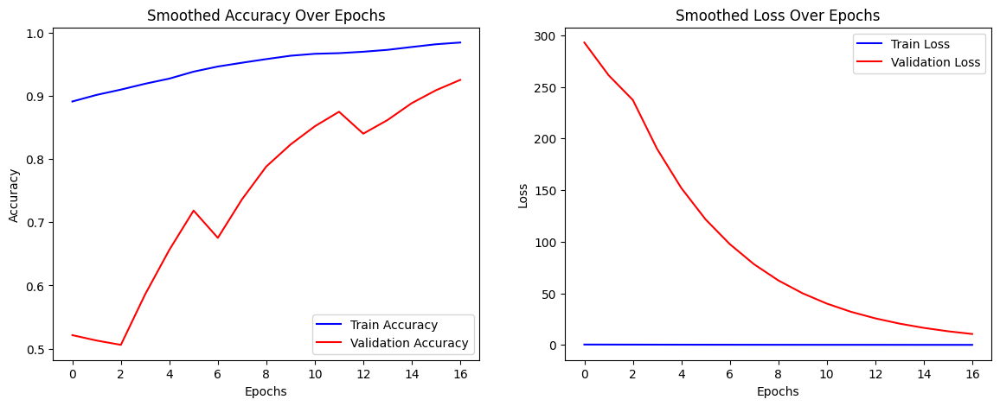

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Function to smooth curves for better visualization
def smooth_curve(points, factor=0.8):
    smoothed_points = []
    for point in points:
        if smoothed_points:
            smoothed_points.append(smoothed_points[-1] * factor + point * (1 - factor))
        else:
            smoothed_points.append(point)
    return smoothed_points

# Plot accuracy and loss
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# Smoothed Accuracy Plot
ax[0].plot(smooth_curve(history.history['accuracy']), label='Train Accuracy', color='blue')
ax[0].plot(smooth_curve(history.history['val_accuracy']), label='Validation Accuracy', color='red')
ax[0].set_title("Smoothed Accuracy Over Epochs")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")
ax[0].legend()

# Smoothed Loss Plot
ax[1].plot(smooth_curve(history.history['loss']), label='Train Loss', color='blue')
ax[1].plot(smooth_curve(history.history['val_loss']), label='Validation Loss', color='red')
ax[1].set_title("Smoothed Loss Over Epochs")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")
ax[1].legend()

plt.show()


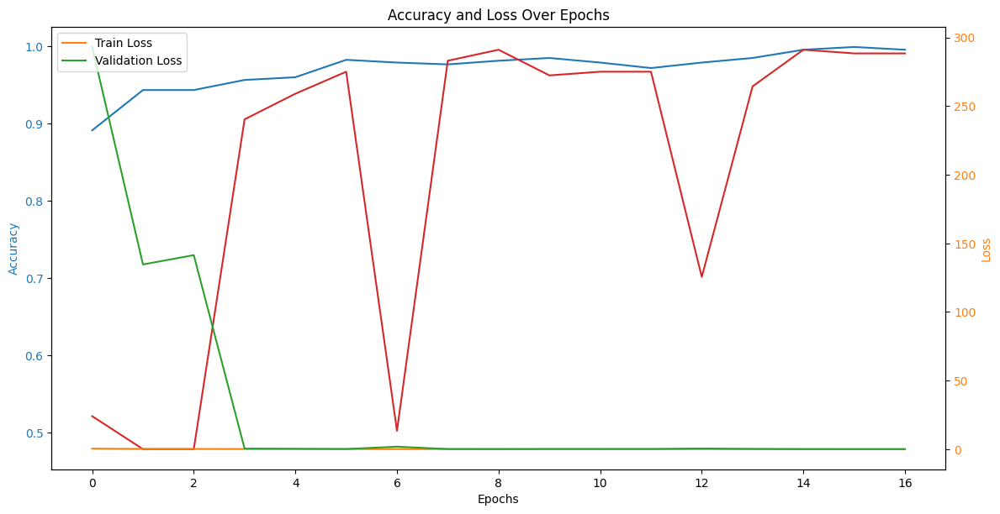

In [ ]:
# Plot combined accuracy and loss
fig, ax1 = plt.subplots(figsize=(12, 6))

# Accuracy plot
color = 'tab:blue'
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy', color=color)
ax1.plot(history.history['accuracy'], label='Train Accuracy', color=color)
ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', color='tab:red')
ax1.tick_params(axis='y', labelcolor=color)

# Create second y-axis for loss
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:orange'
ax2.set_ylabel('Loss', color=color)
ax2.plot(history.history['loss'], label='Train Loss', color=color)
ax2.plot(history.history['val_loss'], label='Validation Loss', color='tab:green')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # Adjust layout to avoid overlap
plt.title("Accuracy and Loss Over Epochs")
plt.legend(loc='upper left')
plt.show()


# ResNet50 Model

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, optimizers, losses
import tensorflow as tf


# Initialize Model
def build_model():
    # Input layer
    inputs = layers.Input(shape=(IMAGE_WIDTH, IMAGE_HEIGHT, 3))

    # Data augmentation block (optional, replace with your own augmentation pipeline)
    x = img_augmentation(inputs)

    # Load ResNet50 with pre-trained ImageNet weights
    base_model = ResNet50(include_top=False, weights="imagenet", input_tensor=x)

    # Rebuild the top layers
    x = layers.GlobalAveragePooling2D(name="avg_pool")(base_model.output)
    x = layers.BatchNormalization()(x)

    top_dropout_rate = 0.4
    x = layers.Dropout(top_dropout_rate, name="top_dropout")(x)

    # Add the output layer
    outputs = layers.Dense(NUM_CLASSES, activation="softmax", name="pred")(x)

    # Create the complete model
    model = tf.keras.Model(inputs, outputs, name="ResNet50")

    # Compile the model
    optimizer = optimizers.Adam(learning_rate=1e-3)
    loss = losses.SparseCategoricalCrossentropy()  # Use `CategoricalCrossentropy` for one-hot labels
    model.compile(
        optimizer=optimizer, loss=loss, metrics=["accuracy"]
    )

    model.summary()

    return model

In [ ]:
# Build the model
model = build_model()


history = model.fit(train_ds, validation_data = validation_ds,
                    callbacks = [lr_callback, stop_callback],
                    epochs = EPOCHS, verbose = 1)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "ResNet50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ img_augmentation          │ (None, 224, 224, 3)    │              0 │ input_layer_3[0][0]    │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ img_augmentation[1][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)             

 Total params: 23,600,002 (90.03 MB)

 Trainable params: 23,542,786 (89.81 MB)

 Non-trainable params: 57,216 (223.50 KB)

Epoch 1/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 69s 522ms/step - accuracy: 0.8721 - loss: 0.5872 - val_accuracy: 0.4787 - val_loss: 2579.3379 - learning_rate: 0.0010
Epoch 2/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 33s 394ms/step - accuracy: 0.8994 - loss: 0.3761 - val_accuracy: 0.5213 - val_loss: 20980.6230 - learning_rate: 0.0010
Epoch 3/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 21s 402ms/step - accuracy: 0.8611 - loss: 0.3693 - val_accuracy: 0.6209 - val_loss: 8.6521 - learning_rate: 0.0010
Epoch 4/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 21s 417ms/step - accuracy: 0.9232 - loss: 0.2191 - val_accuracy: 0.4265 - val_loss: 93.5363 - learning_rate: 0.0010
Epoch 5/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 18s 400ms/step - accuracy: 0.9294 - loss: 0.1876 - val_accuracy: 0.6919 - val_loss: 1.3888 - learning_rate: 0.0010
Epoch 6/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 20s 397ms/step - accuracy: 0.9302 - loss: 0.1858 - val_accuracy: 0.7062 - val_loss: 2.6285 - learning_rate: 0.0010
Epoch 7/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 21s 400ms/step - accuracy: 0.

In [ ]:
# Print final accuracy and loss
print(f"Final Training Accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Final Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}")
print(f"Final Training Loss: {history.history['loss'][-1]:.4f}")
print(f"Final Validation Loss: {history.history['val_loss'][-1]:.4f}")


Final Training Accuracy: 0.9810
Final Validation Accuracy: 0.9336
Final Training Loss: 0.0728
Final Validation Loss: 0.1356


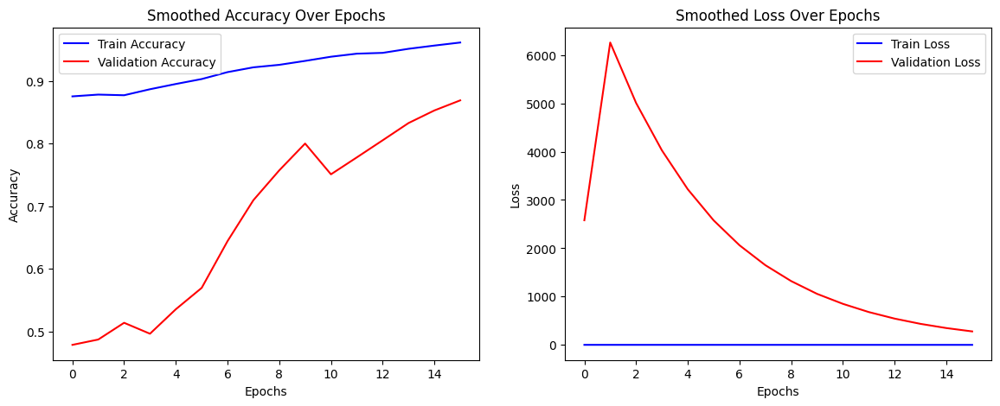

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Function to smooth curves for better visualization
def smooth_curve(points, factor=0.8):
    smoothed_points = []
    for point in points:
        if smoothed_points:
            smoothed_points.append(smoothed_points[-1] * factor + point * (1 - factor))
        else:
            smoothed_points.append(point)
    return smoothed_points

# Plot accuracy and loss
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# Smoothed Accuracy Plot
ax[0].plot(smooth_curve(history.history['accuracy']), label='Train Accuracy', color='blue')
ax[0].plot(smooth_curve(history.history['val_accuracy']), label='Validation Accuracy', color='red')
ax[0].set_title("Smoothed Accuracy Over Epochs")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")
ax[0].legend()

# Smoothed Loss Plot
ax[1].plot(smooth_curve(history.history['loss']), label='Train Loss', color='blue')
ax[1].plot(smooth_curve(history.history['val_loss']), label='Validation Loss', color='red')
ax[1].set_title("Smoothed Loss Over Epochs")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")
ax[1].legend()

plt.show()


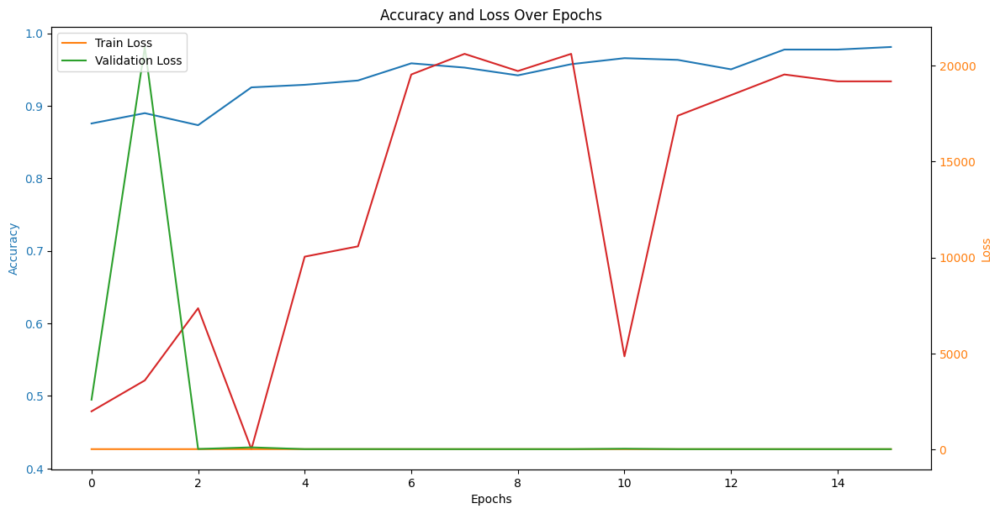

In [ ]:
# Plot combined accuracy and loss
fig, ax1 = plt.subplots(figsize=(12, 6))

color = 'tab:blue'
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy', color=color)
ax1.plot(history.history['accuracy'], label='Train Accuracy', color=color)
ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', color='tab:red')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:orange'
ax2.set_ylabel('Loss', color=color)
ax2.plot(history.history['loss'], label='Train Loss', color=color)
ax2.plot(history.history['val_loss'], label='Validation Loss', color='tab:green')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # Adjust layout to avoid overlap
plt.title("Accuracy and Loss Over Epochs")
plt.legend(loc='upper left')
plt.show()


In [ ]:
from google.colab import files

# Save your model first (if not saved already)
torch.save(model.state_dict(), "diabetic_ulcer_model.pth")

# Download the model to your local machine
files.download("diabetic_ulcer_model.pth")


NameError: name 'torch' is not defined